# Description

This document translated on English language. Below English notes you can see original version of description on Russian.

This work is devoted to the development and testing of a YOLO-like CV model based on ResNet50, as well as analysis of the work of the classic YOLO v8 model from ultralystics, with data preprocessing.

# Object detection

**[EN]** The task is to detect maps in images.

The archive contains about 300 images, the data is stored in xml in PascalVOC format.




In [1]:
# class_dict = {"Baji":0, "Bara":1, "Bhutan":2, "Bhuti":3, "Buffalo Masu(Dakulaa)":4, "Channa":5,"Dhau":6,"Kachilaa":7, "Lain tarkari":8,"Lainachar":9,"Saag":10,
# "Thoo":11,"aloo":12,"egg":13, "sapumicha":14,"yomari":15}

In [2]:
# class_dict = {name.strip(): idx for name, idx in {
#     "Baji":0, "Bara":1, "Bhutan":2, "Bhuti":3, "Buffalo Masu(Dakulaa)":4, 
#     "Channa":5,"Dhau":6,"Kachilaa":7, "Lain tarkari":8, "Lainachar":9,
#     "Saag":10, "Thoo":11, "aloo":12, "egg":13, "sapumicha":14, "yomari":15
# }.items()}


## Data

**[EN]** The markup is in the xmls folder, the pictures are in images.

In [1]:
print("HELLO")

HELLO


In [2]:
# # Cards -- uncomment
# !wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip
# !unzip -q data.zip

In [ ]:
# pip install numpy albumentations

  Using cached pydantic-2.10.6-py3-none-any.whl.metadata (30 kB)
  Using cached annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
  Using cached pydantic_core-2.27.2-cp310-cp310-win_amd64.whl.metadata (6.7 kB)
   ---------------------------------------- 0.0/39.4 MB ? eta -:--:--
   ---------------------------------------- 0.3/39.4 MB ? eta -:--:--
    --------------------------------------- 0.5/39.4 MB 1.4 MB/s eta 0:00:28
    --------------------------------------- 0.8/39.4 MB 1.5 MB/s eta 0:00:27
   - -------------------------------------- 1.0/39.4 MB 1.1 MB/s eta 0:00:36
   - -------------------------------------- 1.3/39.4 MB 1.2 MB/s eta 0:00:32
   - -------------------------------------- 1.3/39.4 MB 1.2 MB/s eta 0:00:32
   - -------------------------------------- 1.8/39.4 MB 1.2 MB/s eta 0:00:31
   -- ------------------------------------- 2.4/39.4 MB 1.4 MB/s eta 0:00:27
   -- ------------------------------------- 2.9/39.4 MB 1.5 MB/s eta 0:00:24
   --- ---------------------

In [2]:
import torch
from xml.etree import ElementTree as ET
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from pathlib import Path
import glob
import numpy as np
from PIL import Image
import torchvision
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from torch import nn
import shutil
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import cv2

# Get data from XML

**[EN]** Since you will have to read from xml files, you need to add the get_xml_data function before this in order to pull up annotations based on the name of the picture. A function can and should be passed a certain class_dict. It is also present when initializing the dataset below. With its help you can turn the class name into int. Further, it is assumed that the class comes as int.


In [3]:
# def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
#     # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
#     filename = image_name.split("/")[-1].split(".")[0]
#     # read xml
#     tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
#     treeroot = tree.getroot()
#     # iterate over bboxes
#     bboxes = []
#     names = []
#     sizes = []

#     for member in treeroot.findall("object"):
#         name = member.find('name').text
#         names.append(class_dict[name])

#     for border in treeroot.iter("bndbox"):
#         # you need: xmin ymin xmax ymax, class in dict
#         xmin = int(border.find('xmin').text)
#         ymin = int(border.find('ymin').text)
#         xmax = int(border.find('xmax').text)
#         ymax = int(border.find('ymax').text)
#         res = [xmin, ymin, xmax, ymax]
#         sizes.append(res)

#     #print(names, sizes)
#     return [sizes[el] + [names[el]] for el in range(len(names))]

In [4]:
import os
from pathlib import Path
import xml.etree.ElementTree as ET

def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # Extract filename without extension
    filename = Path(image_name).stem
    # Correct XML path construction
    xml_path = Path(root) / xml_prefix.strip("/") / f"{filename}.xml"

    # Ensure the path is resolved correctly
    if not xml_path.exists():
        print(f"❌ Error: XML file not found - {xml_path}")
        return []

    try:
        tree = ET.parse(xml_path)
    except Exception as e:
        print(f"❌ Error parsing XML: {xml_path}, {e}")
        return []

    treeroot = tree.getroot()
    bboxes = []

    for obj in treeroot.findall("object"):
        name = obj.find('name').text.strip()

        if name not in class_dict:
            print(f"⚠️ Warning: Class '{name}' not found in class_dict")
            continue  # Skip unknown classes

        xmin = int(obj.find("bndbox/xmin").text)
        ymin = int(obj.find("bndbox/ymin").text)
        xmax = int(obj.find("bndbox/xmax").text)
        ymax = int(obj.find("bndbox/ymax").text)

        # Ensure bounding box is valid
        if xmin >= xmax or ymin >= ymax:
            print(f"⚠️ Warning: Invalid bbox {xmin, ymin, xmax, ymax} for {filename}. Skipping!")
            continue

        bbox = [xmin, ymin, xmax, ymax, class_dict[name]]
        bboxes.append(bbox)

    if not bboxes:
        print(f"⚠️ Warning: No valid bounding boxes found in {filename}")

    print(f"✅ Extracted bounding boxes for {filename}: {bboxes}")
    return bboxes


**[EN]** Below you can see what the xml for images looks like. We need to get the target and bbox.

**[RU]** Ниже можно увидеть, как выглядит xml для картинок. Нам нужно доставать таргет и bbox.

In [5]:
# with open("/kaggle/working/data/xmls/cam_image1.xml") as annot_file:
with open("./data/xmls/test_aloo_aug_265.xml") as annot_file:
    print(''.join(annot_file.readlines()))

<annotation><folder>images</folder><filename>test_aloo_aug_265.jpg</filename><size><width>1219</width><height>1600</height><depth>3</depth></size><object><name>aloo</name><bndbox><xmin>0</xmin><ymin>0</ymin><xmax>1219</xmax><ymax>1600</ymax></bndbox></object></annotation>


**[EN]** Let's check the functionality of the written function.

**[RU]** Проверим работоспособность написанной функции.

In [6]:
import json

root = "./data"
filenames = np.array(glob.glob(root + "/images/*"))
image_name = root + "/xmls/" + filenames[0]
# image_name = "/kaggle/working/data/xmls/cam_image1.xml"
image_name = "./data/xmls/test_aloo_aug_265.xml"
# with open(str(root) + "/class_dict", "r") as f:
#     class_dict = eval(f.readline())

# Read class_dict safely
with open(f"{root}/class_dict", "r") as f:
    class_dict_content = f.read().strip()  # Read entire file and strip extra spaces
    class_dict = json.loads(class_dict_content)  # Parse JSON safely

# Print to verify
print("Class Dictionary Loaded:", class_dict)

Class Dictionary Loaded: {'Baji': 0, 'Bara': 1, 'Bhutan': 2, 'Bhuti': 3, 'Buffalo Masu(Dakulaa)': 4, 'Channa': 5, 'Dhau': 6, 'Kachilaa': 7, 'Lain tarkari': 8, 'Lainachar': 9, 'Saag': 10, 'Thoo': 11, 'aloo': 12, 'egg': 13, 'sapumicha': 14, 'yomari': 15}


In [7]:
class_dict

{'Baji': 0,
 'Bara': 1,
 'Bhutan': 2,
 'Bhuti': 3,
 'Buffalo Masu(Dakulaa)': 4,
 'Channa': 5,
 'Dhau': 6,
 'Kachilaa': 7,
 'Lain tarkari': 8,
 'Lainachar': 9,
 'Saag': 10,
 'Thoo': 11,
 'aloo': 12,
 'egg': 13,
 'sapumicha': 14,
 'yomari': 15}

In [8]:
get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/")

✅ Extracted bounding boxes for test_aloo_aug_265: [[0, 0, 1219, 1600, 12]]


[[0, 0, 1219, 1600, 12]]

In [9]:
image_name = "./data/xmls/test_aloo_aug_265.xml"

# Verify if class_dict is loaded correctly
print("Loaded class_dict:", class_dict)

# Test if XML parsing works correctly
bbox_data = get_xml_data(image_name, root, class_dict)
print("Bounding Box Data:", bbox_data)


Loaded class_dict: {'Baji': 0, 'Bara': 1, 'Bhutan': 2, 'Bhuti': 3, 'Buffalo Masu(Dakulaa)': 4, 'Channa': 5, 'Dhau': 6, 'Kachilaa': 7, 'Lain tarkari': 8, 'Lainachar': 9, 'Saag': 10, 'Thoo': 11, 'aloo': 12, 'egg': 13, 'sapumicha': 14, 'yomari': 15}
✅ Extracted bounding boxes for test_aloo_aug_265: [[0, 0, 1219, 1600, 12]]
Bounding Box Data: [[0, 0, 1219, 1600, 12]]


**[EN]** Below is the code for a standard Dataset from the pytorch library. Dataset requires implementation of `__getitem__` and `__len__` methods. Next, these methods will be used to generate batches for training.

In [10]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(str(self.root / "images/*")))

        # ✅ Read and parse `class_dict` safely
        with open(str(self.root / "class_dict"), "r", encoding="utf-8") as f:
            self.class_dict = json.loads(f.read().strip())  # Read entire file as JSON

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}  # Inverse mapping

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        split_idx = int(len(self.filenames) * 0.9)
        self.filenames = (
            self.filenames[permutation[:split_idx]].tolist()
            if train
            else self.filenames[permutation[split_idx:]].tolist()
        )

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        image = np.array(Image.open(fname).convert("RGB"))
        bboxes = get_xml_data(fname, self.root, self.class_dict)  # Ensure `get_xml_data` is defined

        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

**[EN]** Total images in the archive:


In [11]:
len(np.array(glob.glob(root + "/images/*")))

7545

In [12]:
len(np.array(glob.glob(root + "/images/*")))

7545

 Below we define standard normalizations and size reduction to 512x512.


In [13]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

# train_transform = A.Compose(
#     [
#         A.Resize(512, 512),
#         A.augmentations.transforms.Normalize(mean=mean, std=std),
#         ToTensorV2(),
#     ],
#     bbox_params=dict(format="pascal_voc", min_visibility=0.3),
# )

# test_transform = A.Compose(
#     [
#         A.Resize(512, 512),
#         A.augmentations.transforms.Normalize(mean=mean, std=std),
#         ToTensorV2(),
#     ],
#     bbox_params=dict(format="pascal_voc", min_visibility=0.5),
# )

In [14]:
train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ],
    bbox_params=A.BboxParams(format="pascal_voc", min_visibility=0.0),  # Fix: Ensure no bbox is removed
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ],
    bbox_params=A.BboxParams(format="pascal_voc", min_visibility=0.0),  # Fix: Ensure no bbox is removed
)


In [15]:
train_ds = PascalDataset(root="./data", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data", transform=test_transform, train=False)

# Visualize

Now that we've loaded the data, it's a good idea to take a look at it before training any models. Let's write a function `visualize` that takes lists of images and rectangles as input and draws these rectangles on the images.

The dataset has `class_dict_inv`, which allows you to do the reverse conversion: int, containing the class, in a line with the name.

First, let's roll back the image normalization. Let's write a function `back_normalize` that will do this.



In [16]:
def back_normalize(img, mean, std, max_pixel_value=255.0):
    mean = np.array(mean, dtype=np.float32)
    mean *= max_pixel_value

    std = np.array(std, dtype=np.float32)
    std *= max_pixel_value

    img = torch.permute(img, (1, 2, 0))

    img = np.asarray(img).astype(np.float32)
    img *= std
    img += mean
    return np.around(img).astype(np.int32)

In [17]:
BOX_COLOR = (0, 255, 0)
TEXT_COLOR = (0, 0, 0)

def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = bbox
    x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)

    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)

    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35,
        color=TEXT_COLOR,
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(images, bboxes_class):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    all_bboxes = [np.asarray([el[:-1] for el in bbox], dtype=float) for bbox in bboxes_class]
    all_category_ids = [np.asarray([el[-1] for el in bbox], dtype=float).astype(int).tolist() for bbox in bboxes_class]
    category_id_to_name = train_ds.class_dict_inv

    fig, axes = plt.subplots(
        len(images) // 3 if len(images) % 3 == 0 else len(images) // 3 + 1, len(images) if len(images) < 3 else 3, figsize=(16, 12), dpi=100
    )

    done_images = []
    for image, bboxes, category_ids in zip(images, all_bboxes, all_category_ids):
        img = back_normalize(image, mean, std).copy()
        for bbox, category_id in zip(bboxes, category_ids):
            class_name = category_id_to_name[category_id]
            img = visualize_bbox(img, bbox, class_name)
        done_images.append(img)
    plt.axis('off')
    if len(done_images) > 1:
        axes = axes.flatten()
        for img, ax in zip(done_images, axes):
            ax.imshow(img)
    else:
        plt.imshow(done_images[0])
    plt.show()


# https://albumentations.ai/docs/examples/example_bboxes2/

In [18]:
# pip install numpy<2


In [19]:
pip show numpy


Name: numpy
Version: 1.26.4
Summary: Fundamental package for array computing in Python
Home-page: https://numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: Copyright (c) 2005-2023, NumPy Developers.
        All rights reserved.
        
        Redistribution and use in source and binary forms, with or without
        modification, are permitted provided that the following conditions are
        met:
        
            * Redistributions of source code must retain the above copyright
               notice, this list of conditions and the following disclaimer.
        
            * Redistributions in binary form must reproduce the above
               copyright notice, this list of conditions and the following
               disclaimer in the documentation and/or other materials provided
               with the distribution.
        
            * Neither the name of the NumPy Developers nor the names of any
               contributors may be used to endorse or promo

✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_449: [[0, 0, 2136, 4624, 4]]
✅ Extracted bounding boxes for test_Bhuti_aug_294: [[0, 0, 4624, 2136, 3]]
✅ Extracted bounding boxes for train_Thoo_aug_389: [[0, 0, 652, 628, 11]]
✅ Extracted bounding boxes for train_Kachilaa_aug_574: [[0, 0, 2136, 4624, 7]]
✅ Extracted bounding boxes for test_aloo_aug_329: [[0, 0, 2136, 4624, 12]]
✅ Extracted bounding boxes for test_Saag_aug_163: [[0, 0, 4624, 2136, 10]]


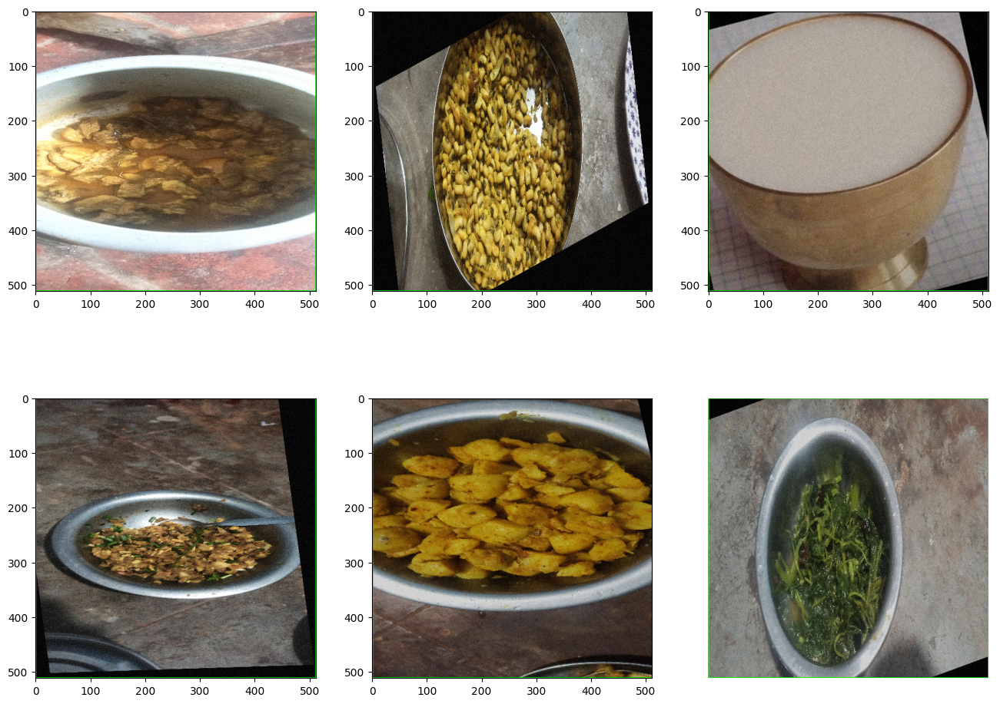

In [20]:
# import torch
# from pathlib import Path
# import glob
# import json
# import numpy as np
# from PIL import Image


out = [train_ds[i] for i in range(6)]

images = [o["image"] for o in out]
bboxes = [o["bboxes"] for o in out]

visualize(images, bboxes)

✅ Extracted bounding boxes for test_sapumicha_aug_458: [[0, 0, 236, 236, 14]]
✅ Extracted bounding boxes for test_sapumicha_aug_458: [[0, 0, 236, 236, 14]]


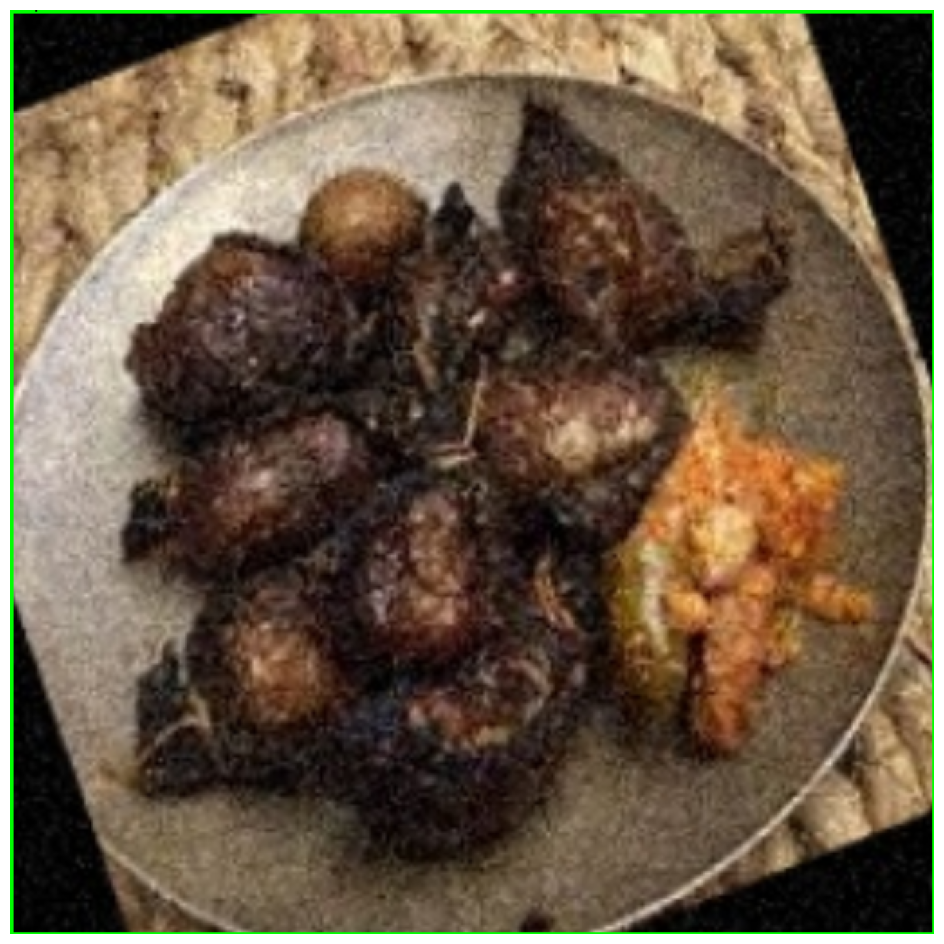

In [21]:
visualize([train_ds[7]['image']], [train_ds[7]['bboxes']])

# YOLO-like detector based on ResNet50

Now we have to implement a detector similar to YOLO. This is one of the simplest detectors in terms of implementation. YOLO is described in the article: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Here we will change it a little and simplify it. We will use ResNet to extract features.
At the output we will receive a feature map of size 16x16.


We convert lists of bounding boxes to the target downsampled grid. For this we

* compute centers of bounding boxes ($c_x, c_y$)
* change center coordinates (offset from the top left corner for each corresponding grid cell on a small grid)
* normalize box height and with to $[0, 1]$
* fill the target grid with values

## Collate function

First of all, we need to implement the collate function. This feature will allow us to customize exactly how a batch is constructed from examples (see [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) for details).

This function should take a sheet of rectangles as input and generate a tensor of size Bx16x16x6.
The first dimension is the number of examples in the batch. Next come two spatial dimensions, this is a 16 by 16 grid.

Our channels will contain:
* Shifts of the bbox center relative to the beginning of the cell (a cell is a “pixel” in a 16 by 16 image at the network output). These shifts will be recorded in the cell to which they belong. 2 channels (X, Y)
* Normalized bbox width and height. 2 channels (W, H)
* Confidence grid. We will use it to filter the grid’s confidence in the presence of a bbox in a given cell. The target contains 1 where bbox is present, and 0 otherwise. 1 channel
* Detection class (the same int obtained from the string with the name)



In [22]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = zip(*[(b["image"], b["bboxes"]) for b in batch])

    batch_boxes = list(batch_boxes)
    
    for i, boxes in enumerate(batch_boxes):
        if len(boxes) == 0:
            print(f"Warning: Image {i} has no bounding boxes. Assigning a dummy bbox.")
            batch_boxes[i] = [[0, 0, 1, 1, 0]]  # Assign a dummy bbox (min size, class 0)

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape
    target = torch.zeros((b, 6, h // downsample, w // downsample), device=imgs.device)

    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(torch.tensor(boxes, dtype=torch.float32), 1, dim=-1)
        )

        x_cell = downsample
        y_cell = downsample

        w_box = (xmax - xmin) / w
        h_box = (ymax - ymin) / h
        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2
        cx_idx = cx // x_cell
        cy_idx = cy // y_cell
        cx_box = (cx - x_cell * cx_idx) / x_cell
        cy_box = (cy - y_cell * cy_idx) / y_cell

        target[i, :, cy_idx.long(), cx_idx.long()] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}


Below you can see an example of what a 16 by 16 grid looks like in the original image:

✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_239: [[0, 0, 3472, 4640, 4]]
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_239: [[0, 0, 3472, 4640, 4]]


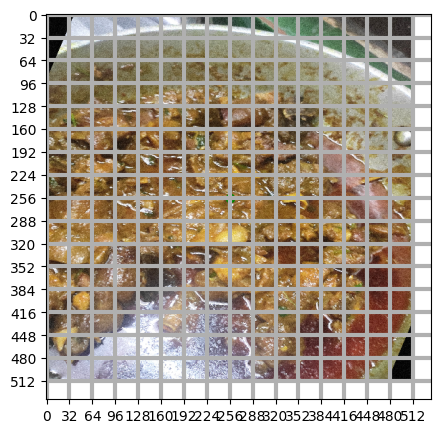

In [23]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

# Decode prediction

**[EN]** The output of our mesh will be slightly larger than Bx16x16x6. Why?

We are solving a problem where there is more than one class. Let us recall the problem of multiclassification of pictures: target is one number, but the output of the grid contained a long, long vector, from which we obtain the probability of belonging to a particular class. It's the same here
but as if in two dimensions: each cell from these 16 * 16 will have its own vector of length C, which we will use to determine the class.

Let's implement the inverse of the 'collate_fn' transformation to decode the output of the neural network.
By applying the decode_prediction function to the output of the collate function, we can obtain an initial set of rectangles with the correct sizes and coordinates, as well as classes. By applying a neural network to the output, we should also get a set of rectangles, also with the correct classes.

That is, you need to perform operations from 'collate_fn' in the opposite direction,
but keep in mind that the output of the neuron will be a little longer, and there we must take argmax to determine the class.

Hint: target classes come at the end. In the neuron they will also be at the end, but there will be more than 1 of them. You can check the number of channels of the incoming object, if it is 6, then we have target in front of us and we need to take the value that is written in the cell.
Otherwise (there are more than 6 channels), we have the output of the neuron, and we must take the most probable one.

In [24]:
def decode_prediction(pred, upsample=32, threshold=0.7):
    b, c, h_smp, w_smp = pred.shape
    img_w, img_h = w_smp * upsample, h_smp * upsample

    all_bboxes = []
    for batch in pred:
        if c > 6:
            batch = batch.detach().numpy()
            predicted = np.argmax(batch[5:], axis=0)
            batch[5] = predicted
            batch_prep = batch[:6]
        else:
            batch_prep = batch

        bboxes = []
        for idx_h in range(h_smp):
            for idx_w in range(w_smp):
                # print(idx_h, idx_w)
                if batch_prep[4][idx_h][idx_w] > threshold:
                    cx = batch_prep[0][idx_h][idx_w].item()
                    cy = batch_prep[1][idx_h][idx_w].item()
                    w = batch_prep[2][idx_h][idx_w].item()
                    h = batch_prep[3][idx_h][idx_w].item()
                    cls = batch_prep[5][idx_h][idx_w].item()
                    # print(cx, cy, w, h, cls)

                    center = [(cx + idx_w) * upsample, (cy + idx_h) * upsample]
                    w *= img_w
                    h *= img_h

                    xmin = center[0] - w / 2
                    # print('xmin ', xmin)
                    xmax = center[0] + w / 2
                    # print('xmax ', xmax)
                    ymin = center[1] - h / 2
                    # print('ymin ', ymin)
                    ymax = center[1] + h / 2
                    # print('ymax ', ymax)
                    cls = int(cls)
                    # print('cls ', cls)

                    cortege = (xmin, ymin, xmax, ymax, cls)
                    bboxes.append(cortege)
                    # print(bboxes)

        all_bboxes.append(bboxes)

    return all_bboxes

In [25]:
out = [train_ds[i] for i in range(6)]

test_collate = collate_fn(out)
decode_prediction(test_collate['target'])

✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_449: [[0, 0, 2136, 4624, 4]]
✅ Extracted bounding boxes for test_Bhuti_aug_294: [[0, 0, 4624, 2136, 3]]
✅ Extracted bounding boxes for train_Thoo_aug_389: [[0, 0, 652, 628, 11]]
✅ Extracted bounding boxes for train_Kachilaa_aug_574: [[0, 0, 2136, 4624, 7]]
✅ Extracted bounding boxes for test_aloo_aug_329: [[0, 0, 2136, 4624, 12]]
✅ Extracted bounding boxes for test_Saag_aug_163: [[0, 0, 4624, 2136, 10]]


[[(0.0, 0.0, 512.0, 512.0, 4)],
 [(0.0, 0.0, 512.0, 512.0, 3)],
 [(0.0, 0.0, 512.0, 512.0, 11)],
 [(0.0, 0.0, 512.0, 512.0, 7)],
 [(0.0, 0.0, 512.0, 512.0, 12)],
 [(0.0, 0.0, 512.0, 512.0, 10)]]

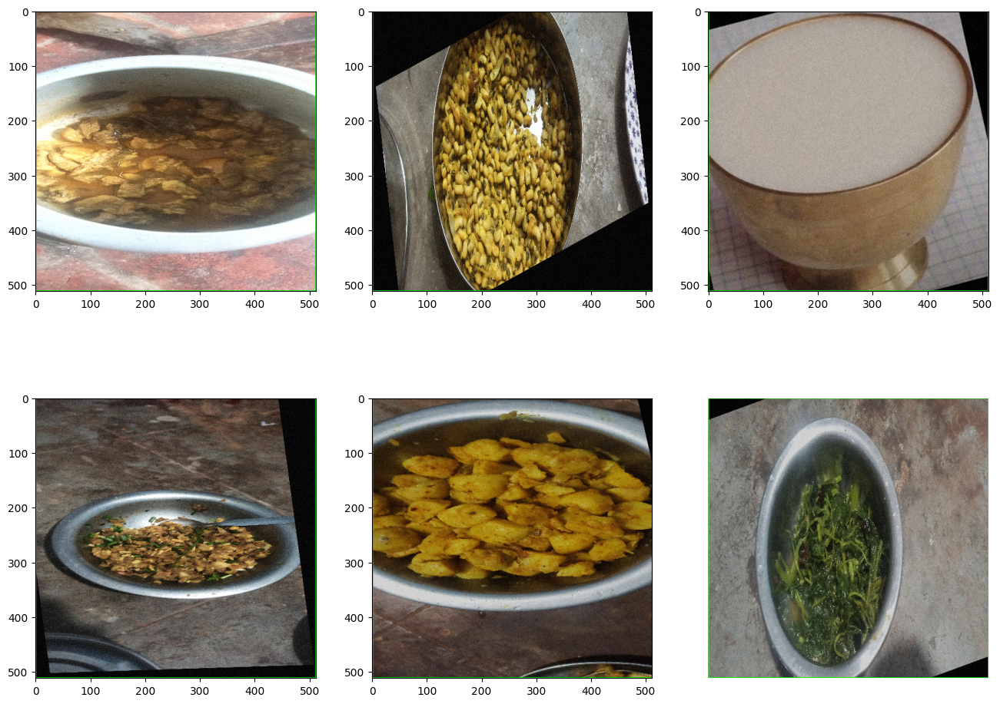

In [26]:
visualize(test_collate['image'], decode_prediction(test_collate['target']))

# Code model

**[EN]** First of all, let’s select the first 4 blocks (up to layer4 inclusive) of ResNet50. Next, let's add several blocks (Conv2D, BatchNorm2D, ReLU). We will gradually reduce the number of channels to 5+C, and the image size to 16 by 16. For example, 2048 -> 512 -> 128 -> 32 -> 5+C, where C is the number of classes in your dataset. The core size is 3, padding is 1.
But there are many options, you can try different ones! **The last layer must be a convolution.** Since all the values ​​that we predict are in the interval from 0 to 1 (thanks to normalization with cells), we will also apply a sigmoid after the final convolution. It won't hurt the classes in this setup.
ResNet50 under the hood will eventually bring the image to our size and the final out. With the fully connected layer removed, the 512x512x3 image will be exactly 16x16x2048, as we need, and then we will reduce the dimension of the channels using convolutional layers to 5+C, without changing the width and height of the tensor.

In [27]:
C =  len(train_ds.class_dict)


class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        mod_model = list(model.children())[:-2]

        self.resnet50 = nn.Sequential(*mod_model)
        # out -> 16x16x2048

        self.conv1 = nn.Sequential(nn.Conv2d(2048, 512, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(512, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv2 = nn.Sequential(nn.Conv2d(512, 128, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(128, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv3 = nn.Sequential(nn.Conv2d(128, 32, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(32, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv4 = nn.Sequential(nn.Conv2d(32, 5 + C, kernel_size=(3, 3), padding=(1, 1), bias=False),
                                   nn.BatchNorm2d(5 + C, eps=1e-05, momentum=0.1),
                                   nn.ReLU())

        self.conv5 = nn.Conv2d(5 + C, 5 + C, kernel_size=(3, 3), padding=(1, 1), bias=False)

        self.sigmoid = nn.Sigmoid()

    def forward(self, img):

        img = self.resnet50(img)
        img = self.conv1(img)
        img = self.conv2(img)
        img = self.conv3(img)
        img = self.conv4(img)
        img = self.conv5(img)
        img = self.sigmoid(img)

        return img

# Loss

Let's implement the loss function.

For this:
* Let's make a mask that will indicate the position of the detected objects.
* Loss is similar to the original one for Yolo V1 and consists of 4 parts
    - localization loss - We take MSE according to the box coordinates where there is a detected object
    - box_loss - MSE from the roots of the width and height of the bbox there,
where is the detected object
    - classification_loss - If there is a detected object, then its cross-entropy by its class
    - confidence_loss - Binary cross-entropy of the fact of the presence of an object FOR ALL pixels. This is done separately for detectable objects (weight 1) and for non-detectable objects (weight 0.1 for example, since there are many more of them,
but you can experiment)

In [28]:
C = len(class_dict)  # Update number of classes
C

16

In [29]:
def special_loss(pred, target, check=False, C=C, use_yolo_weights=False):
    """
    pred -> model predictions
    target -> ground truth targets
    check -> if True, returns individual loss components, else total loss
    use_yolo_weights -> applies YOLO weights to loss components
    """
    mse = nn.MSELoss(reduction='none')
    cross_entropy = nn.CrossEntropyLoss(reduction='sum')
    bce = nn.BCELoss(reduction='none')

    localization_loss = 0
    box_loss = 0
    classification_loss = 0
    confidence_loss = 0

    for batch_idx in range(len(pred)):
        mask = target[batch_idx][4].ge(1)
        mask_inv = ~mask

        if mask.sum() == 0:
            print(f"Warning: No positive samples in batch {batch_idx}")
            continue  # Skip batch if no positive labels

        cx_masked_pred = torch.masked_select(pred[batch_idx][0], mask)
        cx_masked_target = torch.masked_select(target[batch_idx][0], mask)
        cy_masked_pred = torch.masked_select(pred[batch_idx][1], mask)
        cy_masked_target = torch.masked_select(target[batch_idx][1], mask)

        localization_loss += torch.sum(mse(cx_masked_pred, cx_masked_target), dim=0)
        localization_loss += torch.sum(mse(cy_masked_pred, cy_masked_target), dim=0)

        w_masked_pred = torch.sqrt(torch.masked_select(pred[batch_idx][2], mask))
        w_masked_target = torch.sqrt(torch.masked_select(target[batch_idx][2], mask))
        h_masked_pred = torch.sqrt(torch.masked_select(pred[batch_idx][3], mask))
        h_masked_target = torch.sqrt(torch.masked_select(target[batch_idx][3], mask))

        box_loss += torch.sum(mse(w_masked_pred, w_masked_target), dim=0)
        box_loss += torch.sum(mse(h_masked_pred, h_masked_target), dim=0)

        cls_list = []
        cls_masked_target = torch.masked_select(target[batch_idx][5], mask)

        # Ensure class indices are valid
        if (cls_masked_target >= C).any():
            print(f"Error: Invalid class index {cls_masked_target.max()} found!")
            continue  # Skip invalid batch

        cls_channels = pred[batch_idx][5:]
        for curr_cls_idx in range(C):
            cls_masked_pred = torch.masked_select(cls_channels[curr_cls_idx], mask)
            cls_list.append(cls_masked_pred)

        stack_cls = torch.stack(cls_list, dim=1)

        # Validate tensor shapes
        if stack_cls.shape[0] != cls_masked_target.shape[0]:
            print(f"Shape Mismatch: stack_cls={stack_cls.shape}, target={cls_masked_target.shape}")
            continue

        classification_loss += cross_entropy(stack_cls, cls_masked_target.type(torch.int64))

        conf_masked_target = [torch.masked_select(target[batch_idx][4], mask),
                              torch.masked_select(target[batch_idx][4], mask_inv)]

        conf_masked_pred = [torch.masked_select(pred[batch_idx][4], mask),
                            torch.masked_select(pred[batch_idx][4], mask_inv)]

        weight_detected = 1
        weight_undetected = 0.1

        confidence_loss += torch.sum(weight_detected * bce(conf_masked_pred[0], conf_masked_target[0]))
        confidence_loss += torch.sum(weight_undetected * bce(conf_masked_pred[1], conf_masked_target[1]))

    if not check:
        if not use_yolo_weights:
            return localization_loss + box_loss + classification_loss + confidence_loss
        else:
            return 5 * localization_loss + 5 * box_loss + classification_loss + confidence_loss
    else:
        return localization_loss, box_loss, classification_loss, confidence_loss


# Fit model

Let's train the model (by writing a training cycle) and show that it works (most likely, objects will be found in 1-2 pictures)

In [30]:
loader = torch.utils.data.DataLoader(train_ds, batch_size=10, collate_fn=collate_fn)

test_batch = next(iter(loader))

print("Batch Image Shape:", test_batch["image"].shape)
print("Batch Target Shape:", test_batch["target"].shape)

# Check for valid bounding boxes
print("First Target:", test_batch["target"][0])

# Check if any bounding boxes are still empty
if torch.all(test_batch["target"] == 0):
    print("ERROR: All bounding boxes are still missing!")
else:
    print("✅ Bounding boxes are correctly loaded!")


✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_449: [[0, 0, 2136, 4624, 4]]
✅ Extracted bounding boxes for test_Bhuti_aug_294: [[0, 0, 4624, 2136, 3]]
✅ Extracted bounding boxes for train_Thoo_aug_389: [[0, 0, 652, 628, 11]]
✅ Extracted bounding boxes for train_Kachilaa_aug_574: [[0, 0, 2136, 4624, 7]]
✅ Extracted bounding boxes for test_aloo_aug_329: [[0, 0, 2136, 4624, 12]]
✅ Extracted bounding boxes for test_Saag_aug_163: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_sapumicha_aug_571: [[0, 0, 236, 176, 14]]
✅ Extracted bounding boxes for test_sapumicha_aug_458: [[0, 0, 236, 236, 14]]
✅ Extracted bounding boxes for train_Saag_aug_513: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_egg_aug_592: [[0, 0, 183, 275, 13]]
Batch Image Shape: torch.Size([10, 3, 512, 512])
Batch Target Shape: torch.Size([10, 6, 16, 16])
First Target: tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0.,

In [31]:
# for member in treeroot.findall("object"):
#     name = member.find('name').text.strip()  # Trim spaces

#     # print(f"🔹 Extracted class name from XML: '{name}'")  # Debugging print

#     if name not in class_dict:
#         print(f"⚠ Error: Class '{name}' is NOT in class_dict! Expected classes: {list(class_dict.keys())}")
#         continue  # Skip this entry if it's invalid
# #
#     names.append(class_dict[name])


In [32]:
pip show jupyter ipywidgets

Name: jupyter
Version: 1.1.1
Summary: Jupyter metapackage. Install all the Jupyter components in one go.
Home-page: https://jupyter.org
Author: Jupyter Development Team
Author-email: jupyter@googlegroups.org
License: BSD
Location: c:\users\lenovo\anaconda3\envs\myenv\lib\site-packages
Requires: ipykernel, ipywidgets, jupyter-console, jupyterlab, nbconvert, notebook
Required-by: 
---
Name: ipywidgets
Version: 8.1.5
Summary: Jupyter interactive widgets
Home-page: http://jupyter.org
Author: Jupyter Development Team
Author-email: jupyter@googlegroups.com
License: BSD 3-Clause License
Location: c:\users\lenovo\anaconda3\envs\myenv\lib\site-packages
Requires: comm, ipython, jupyterlab-widgets, traitlets, widgetsnbextension
Required-by: jupyter
Note: you may need to restart the kernel to use updated packages.


In [46]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(21)
EPOCHS = 15 # Harry Potter 20, Cards 15
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):
    model = model.train()
    pbar = tqdm(loader, leave=False)
    epoch_losses = []
    for batch in pbar:
        pred = model(batch['image'].to(device))
        loss = special_loss(pred.to(device), batch['target'].to(device))
        print(loss)
        epoch_losses.append(loss.item())
        loss.backward()
        opt.step()
        opt.zero_grad()


    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/679 [00:00<?, ?it/s]

✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_449: [[0, 0, 2136, 4624, 4]]
✅ Extracted bounding boxes for test_Bhuti_aug_294: [[0, 0, 4624, 2136, 3]]
✅ Extracted bounding boxes for train_Thoo_aug_389: [[0, 0, 652, 628, 11]]
✅ Extracted bounding boxes for train_Kachilaa_aug_574: [[0, 0, 2136, 4624, 7]]
✅ Extracted bounding boxes for test_aloo_aug_329: [[0, 0, 2136, 4624, 12]]
✅ Extracted bounding boxes for test_Saag_aug_163: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_sapumicha_aug_571: [[0, 0, 236, 176, 14]]
✅ Extracted bounding boxes for test_sapumicha_aug_458: [[0, 0, 236, 236, 14]]
✅ Extracted bounding boxes for train_Saag_aug_513: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_egg_aug_592: [[0, 0, 183, 275, 13]]
tensor(200.3662, grad_fn=<AddBackward0>)
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_160: [[0, 0, 2048, 946, 4]]
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_357: [[0, 0, 900, 1600, 4]]
✅

  0%|          | 0/679 [00:00<?, ?it/s]

✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_449: [[0, 0, 2136, 4624, 4]]
✅ Extracted bounding boxes for test_Bhuti_aug_294: [[0, 0, 4624, 2136, 3]]
✅ Extracted bounding boxes for train_Thoo_aug_389: [[0, 0, 652, 628, 11]]
✅ Extracted bounding boxes for train_Kachilaa_aug_574: [[0, 0, 2136, 4624, 7]]
✅ Extracted bounding boxes for test_aloo_aug_329: [[0, 0, 2136, 4624, 12]]
✅ Extracted bounding boxes for test_Saag_aug_163: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_sapumicha_aug_571: [[0, 0, 236, 176, 14]]
✅ Extracted bounding boxes for test_sapumicha_aug_458: [[0, 0, 236, 236, 14]]
✅ Extracted bounding boxes for train_Saag_aug_513: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_egg_aug_592: [[0, 0, 183, 275, 13]]
tensor(22.9109, grad_fn=<AddBackward0>)
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_160: [[0, 0, 2048, 946, 4]]
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_357: [[0, 0, 900, 1600, 4]]
✅ 

KeyboardInterrupt: 

In [ ]:
# import xml.etree.ElementTree as ET

# def get_xml_data(image_name, root, class_dict, xml_prefix=".xml"):
#     xml_file = root + "/" + image_name.split(".")[0] + xml_prefix
#     try:
#         tree = ET.parse(xml_file)
#         treeroot = tree.getroot()  # Ensure treeroot is defined properly
#     except FileNotFoundError:
#         raise FileNotFoundError(f"XML file not found: {xml_file}")
    
#     names = []
    
#     for member in treeroot.findall("object"):  # Now treeroot is defined
#         name = member.find('name').text.strip()
#         print(f"Checking name: '{name}'")  # Debugging

#         if name not in class_dict:
#             raise KeyError(f"Key '{name}' not found in class_dict. Available keys: {list(class_dict.keys())}")

#         names.append(class_dict[name])

#     return names  # Ensure this function returns valid data


# for member in treeroot.findall("object"):
#     name = member.find('name').text.strip()  # Ensure there are no trailing spaces
#     print(f"Checking name: '{name}'")  # Debugging
#     if name not in class_dict:
#         raise ValueError(f"Key '{name}' not found in class_dict. Check class_dict keys: {list(class_dict.keys())}")
#     names.append(class_dict[name])


In [68]:
# name = member.find('name').text.strip().lower()
# class_dict = {key.lower(): value for key, value in class_dict.items()}  # Normalize keys


NameError: name 'member' is not defined

In [ ]:
# for key in class_dict.keys():
    # print(repr(key))


In [ ]:
# import torch
# from torch import nn
# import torchvision
# from torchvision.models import resnet50, ResNet50_Weights
# import numpy as np
# from xml.etree import ElementTree as ET
# import glob
# from pathlib import Path
# from PIL import Image
# import albumentations as A
# from albumentations.pytorch.transforms import ToTensorV2
# from tqdm.notebook import tqdm

# # ✅ Class Dictionary
# class_dict = {
#     "Baji": 0, "Bara": 1, "Bhutan": 2, "Bhuti": 3, "Buffalo Masu(Dakulaa)": 4,
#     "Channa": 5, "Dhau": 6, "Kachilaa": 7, "Lain tarkari": 8, "Lainachar": 9,
#     "Saag": 10, "Thoo": 11, "aloo": 12, "egg": 13, "sapumicha": 14, "yomari": 15
# }

# # NUM_CLASSES = len(class_dict)
# MAX_BOXES = 10  # Maximum number of boxes per image

# # ✅ Function to Parse XML Files (Updated to include confidence)
# def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
#     filename = image_name.split("/")[-1].split(".")[0]
#     xml_path = str(root) + xml_prefix + filename + ".xml"

#     try:
#         tree = ET.parse(xml_path)
#     except FileNotFoundError:
#         print(f"XML file not found: {xml_path}")
#         return []

#     treeroot = tree.getroot()
#     bboxes = []

#     for obj in treeroot.findall("object"):
#         name = obj.find("name").text.strip()

#         if name not in class_dict:
#             print(f"Warning: '{name}' not in class_dict. Skipping.")
#             continue
        
#         xmin = int(obj.find("bndbox/xmin").text)
#         ymin = int(obj.find("bndbox/ymin").text)
#         xmax = int(obj.find("bndbox/xmax").text)
#         ymax = int(obj.find("bndbox/ymax").text)

#         bboxes.append([xmin, ymin, xmax, ymax, 1, class_dict[name]])  # Added confidence=1

#     return bboxes

# # ✅ Dataset Class (Updated to handle new bbox format)
# class PascalDataset(torch.utils.data.Dataset):
#     def __init__(self, root, transform, train=True, seed=42):
#         self.root = Path(root)
#         self.transform = transform
#         self.filenames = np.array(glob.glob(str(self.root / "images/*")))
        
#         np.random.seed(seed)
#         indices = np.random.permutation(len(self.filenames))
#         split = int(len(self.filenames) * 0.9)
#         self.filenames = self.filenames[indices[:split] if train else indices[split:]]

#     def __getitem__(self, idx):
#         fname = self.filenames[idx]
#         image = np.array(Image.open(fname).convert("RGB"))
#         bboxes = get_xml_data(fname, self.root, class_dict)

#         if not bboxes:
#             bboxes = [[0, 0, 0, 0, 0, 0]]  # Dummy box with confidence=0

#         transformed = self.transform(image=image, bboxes=bboxes)

#         return {
#             "image": transformed["image"],
#             "bboxes": torch.tensor(transformed["bboxes"], dtype=torch.float32)
#         }

#     def __len__(self):
#         return len(self.filenames)

# # ✅ Collate Function (Updated for new target format)
# def collate_fn(batch):
#     imgs = torch.stack([b["image"] for b in batch])
#     targets = [b["bboxes"] for b in batch]

#     # Pad targets to MAX_BOXES
#     padded_targets = []
#     for t in targets:
#         pad_size = MAX_BOXES - len(t)
#         if pad_size > 0:
#             padded_t = torch.cat([t, torch.zeros((pad_size, 6), dtype=torch.float32)], dim=0)
#         else:
#             padded_t = t[:MAX_BOXES]  # Truncate if more than MAX_BOXES
#         padded_targets.append(padded_t)

#     targets = torch.stack(padded_targets)
#     return {"image": imgs, "target": targets}

# # ✅ Data Transforms
# mean, std = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225)
# transform = A.Compose(
#     [A.Resize(512, 512), A.Normalize(mean=mean, std=std), ToTensorV2()],
#     bbox_params=A.BboxParams(format="pascal_voc", min_visibility=0.3, min_area=16),
# )

# # ✅ Create Datasets
# root_dir = "/kaggle/input/yolo-with-resnet-data/data"
# train_ds = PascalDataset(root=root_dir, transform=transform, train=True)
# train_loader = torch.utils.data.DataLoader(
#     train_ds, batch_size=10, collate_fn=collate_fn, shuffle=True
# )

# # ✅ Define Model (Updated for fixed boxes)
# class Detector(nn.Module):
#     def __init__(self, num_classes, max_boxes=MAX_BOXES):
#         super().__init__()
#         self.max_boxes = max_boxes
        
#         # Load ResNet50 backbone
#         self.resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
#         self.backbone = nn.Sequential(*list(self.resnet.children())[:-2])
        
#         # Additional convolutions
#         self.conv1 = nn.Conv2d(2048, 512, kernel_size=3, padding=1)
#         self.conv2 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
#         self.conv3 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        
#         # Global pooling and FC layer
#         self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
#         self.fc = nn.Linear(128, max_boxes * (5 + num_classes))
        
#         # Activations
#         self.relu = nn.ReLU()

#     def forward(self, x):
#         x = self.backbone(x)
#         x = self.relu(self.conv1(x))
#         x = self.relu(self.conv2(x))
#         x = self.relu(self.conv3(x))
#         x = self.global_pool(x)
#         x = x.view(x.size(0), -1)
#         x = self.fc(x)
#         x = x.view(-1, self.max_boxes, 5 + NUM_CLASSES)
        
#         # Apply activations
#         x[:, :, :4] = torch.sigmoid(x[:, :, :4])  # Bounding box coordinates
#         x[:, :, 4] = torch.sigmoid(x[:, :, 4])     # Confidence score
#         x[:, :, 5:] = torch.softmax(x[:, :, 5:], dim=-1)  # Class probabilities
        
#         return x

# # ✅ Loss Function (Updated for new format)
# def special_loss(pred, target):
#     # pred shape: (B, MAX_BOXES, 5+NUM_CLASSES)
#     # target shape: (B, MAX_BOXES, 6)
    
#     # Extract components
#     pred_boxes = pred[..., :4]
#     pred_conf = pred[..., 4]
#     pred_class = pred[..., 5:]
    
#     target_boxes = target[..., :4]
#     target_conf = target[..., 4]
#     target_class = target[..., 5].long()
    
#     # Calculate masks
#     obj_mask = target_conf == 1
#     noobj_mask = target_conf == 0
    
#     # Confidence loss (both objects and no-objects)
#     conf_loss = nn.functional.binary_cross_entropy(
#         pred_conf, target_conf, reduction='mean'
#     )
    
#     # Bounding box loss (only for objects)
#     box_loss = torch.tensor(0.0, device=pred.device)
#     if obj_mask.sum() > 0:
#         box_loss = nn.functional.mse_loss(
#             pred_boxes[obj_mask], target_boxes[obj_mask], reduction='mean'
#         )
    
#     # Class loss (only for objects)
#     class_loss = torch.tensor(0.0, device=pred.device)
#     if obj_mask.sum() > 0:
#         class_loss = nn.functional.cross_entropy(
#             pred_class[obj_mask], target_class[obj_mask], reduction='mean'
#         )
    
#     return conf_loss + box_loss + class_loss

# # ✅ Training Loop
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = Detector(num_classes=NUM_CLASSES).to(device)
# opt = torch.optim.AdamW(model.parameters(), lr=1e-3)
# EPOCHS = 15

# for epoch in range(EPOCHS):
#     model.train()
#     epoch_loss = 0

#     for batch in tqdm(train_loader, leave=False):
#         images = batch["image"].to(device, dtype=torch.float32)
#         targets = batch["target"].to(device, dtype=torch.float32)

#         pred = model(images)
#         loss = special_loss(pred, targets)

#         opt.zero_grad()
#         loss.backward()
#         opt.step()

#         epoch_loss += loss.item()

#     print(f"Epoch {epoch+1}/{EPOCHS}, Loss: {epoch_loss/len(train_loader):.4f}")

In [70]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

Extracted bounding boxes for train_Baji_aug_365: [[0, 0, 861, 679, 1]]
Extracted bounding boxes for train_Bhuti_aug_187: [[0, 0, 2000, 2000, 5]]
Extracted bounding boxes for train_aloo_aug_216: [[0, 0, 900, 1600, 0]]
Extracted bounding boxes for test_Bara_aug_525: [[0, 0, 1200, 827, 2]]
Extracted bounding boxes for train_Bara_aug_368: [[0, 0, 1280, 960, 2]]
Extracted bounding boxes for train_Bhuti_aug_576: [[0, 0, 349, 234, 5]]


In [71]:
# Нужно сделать предсказание и переложить результат на cpu
model = model.eval()
pred = model(batch['image'].to(device)).cpu()
decoded_pred = decode_prediction(pred)

**[EN]** Let's make a visualization. Let's play with threshold.

**[RU]** Сделаем визуализацию. Поиграемся с threshold.

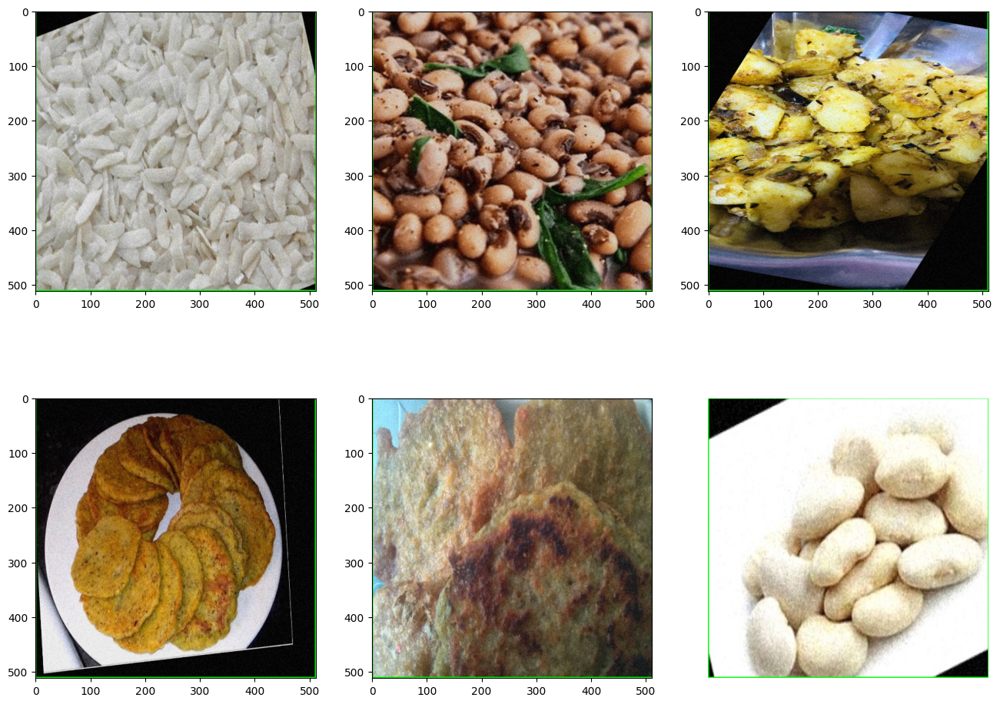

In [72]:
visualize(batch['image'], decoded_pred)

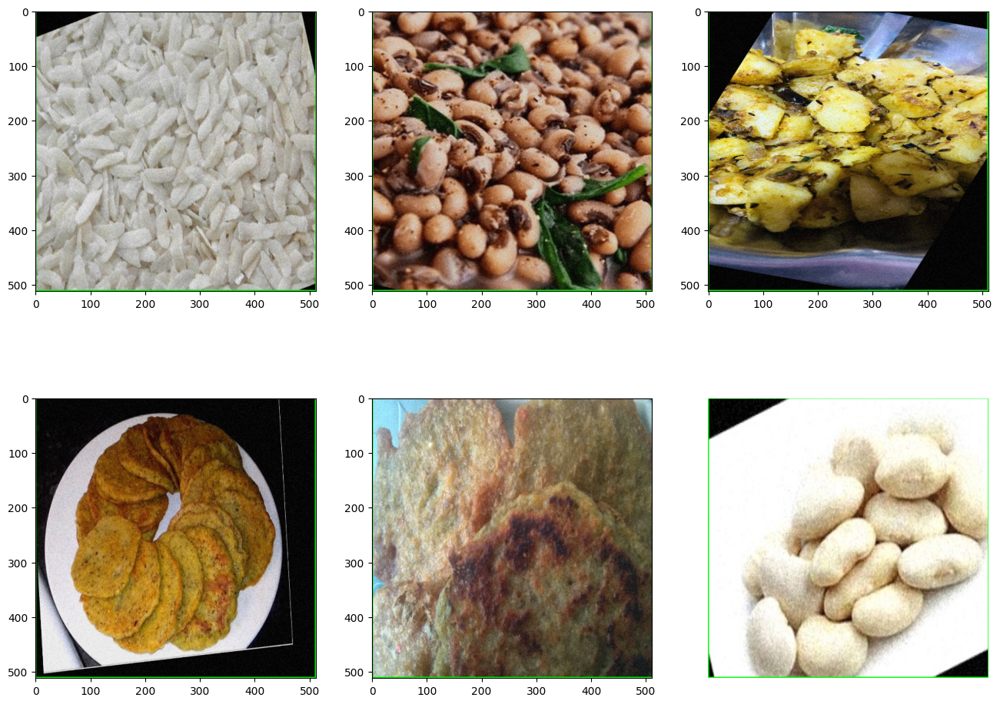

In [73]:
visualize(batch['image'], decode_prediction(pred, threshold=0.8))

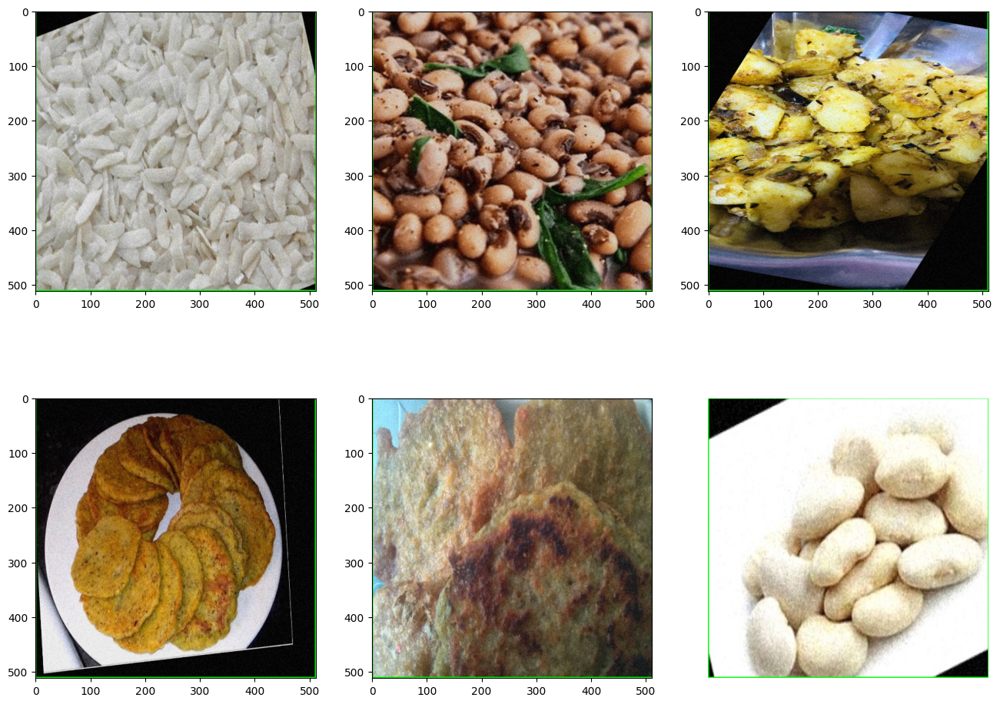

In [74]:
visualize(batch['image'], decode_prediction(pred, threshold=0.3))

**[EN]** The result is very so-so, right? There are many options for improvements, the easiest of which is to attach it to the output [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). If you want, you can read about YOLO v1 [here](https://arxiv.org/abs/1506.02640).

**[RU]** Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# YOLO

**[EN]** Let's move on to simpler things. Let's take a ready-made architecture, train it on our data and see.

For this we will use YOLO v8 from ultralytics.

**[RU]** Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO v8 от ultralytics.

In [34]:
!pip install ultralytics

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
   ---------------------------------------- 0.0/922.1 kB ? eta -:--:--
   ---------------------------------------- 0.0/922.1 kB ? eta -:--:--
   ---------------------- ----------------- 524.3/922.1 kB 1.7 MB/s eta 0:00:01
   ---------------------------------- ----- 786.4/922.1 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 922.1/922.1 kB 1.6 MB/s eta 0:00:00
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


## Convert Data to YOLOv8 PyTorch TXT

**[EN]** In order for the model to be trained further in one line, the data must be transferred to the correct format. Yes, yes, classic JSON wrapping. You can see how to pack correctly [here](https://roboflow.com/formats/yolov8-pytorch-txt).

In short:
* There is .yaml, where the paths to folders with pictures, the number of classes and their names live
* There are train valid folders (we will help you collect them), they have two subfolders:
    - The first images, it contains pictures
    - The second labels, it contains files with names like pictures, but instead of expanding the pictures you need .txt, inside the format is as described on Roboflow

**[RU]** Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [39]:
import os
import shutil

# Remove directories if they exist
shutil.rmtree("train", ignore_errors=True)
shutil.rmtree("valid", ignore_errors=True)

# Create directories
os.makedirs("train/images", exist_ok=True)
os.makedirs("train/labels", exist_ok=True)
os.makedirs("valid/images", exist_ok=True)
os.makedirs("valid/labels", exist_ok=True)

print("Directories created successfully!")


Directories created successfully!


In [ ]:
# !rm -rf train
# !rm -rf valid
# !mkdir -p train/images train/labels valid/images valid/labelsb

The syntax of the command is incorrect.


**[EN]** Let's implement a function that accepts annotations in the original format and returns them in the required format for YOLO v8. This should be an array of ready-made strings that can be immediately thrown into a file by adding \n.

**[RU]** Реализуем функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO v8. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

In [40]:
def annotation2txt(bboxes, w_im, h_im):
    prepared_bboxes = []
    for bbox in bboxes:
        xmin, ymin, xmax, ymax, cls = bbox
        prepared_bboxes.append(' '.join(str(el) for el in
                                [cls,
                                 (xmax + xmin) / 2 / w_im,
                                (ymax + ymin) / 2 / h_im,
                                (xmax - xmin) / w_im,
                                (ymax - ymin) / h_im]))
    return prepared_bboxes

In [42]:
# for i in range(len(train_ds)):
#     result = train_ds.__get_raw_item__(i)

#     shutil.copyfile(
#         result[0], "./train/images/" + result[0].split("/")[-1],
#     )

#     h_im, w_im, ch = np.array(Image.open(result[0])).shape
#     with open(
#         "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
#         "w",
#         encoding="utf8",
#     ) as f:
#         f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

# for i in range(len(test_ds)):
#     result = test_ds.__get_raw_item__(i)

#     shutil.copyfile(
#         result[0], "./valid/images/" + result[0].split("/")[-1],
#     )
#     h_im, w_im, ch = np.array(Image.open(result[0])).shape
#     with open(
#         "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
#         "w",
#         encoding="utf8",
#     ) as f:
#         f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [43]:
# Process train dataset
for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    # Extract filename
    filename = os.path.basename(result[0])  # Gets filename from path

    # Ensure source file exists before copying
    if not os.path.exists(result[0]):
        print(f"Warning: Source file not found - {result[0]}")
        continue

    # Copy image to train directory
    shutil.copyfile(result[0], f"./train/images/{filename}")

    # Read image dimensions correctly
    image = Image.open(result[0])
    w_im, h_im = image.size  # Correct way to get width and height

    # Write annotations to label file
    with open(f"./train/labels/{os.path.splitext(filename)[0]}.txt", "w", encoding="utf8") as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

# Process test dataset
for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    filename = os.path.basename(result[0])

    if not os.path.exists(result[0]):
        print(f"Warning: Source file not found - {result[0]}")
        continue

    shutil.copyfile(result[0], f"./valid/images/{filename}")

    image = Image.open(result[0])
    w_im, h_im = image.size  # Fix shape retrieval

    with open(f"./valid/labels/{os.path.splitext(filename)[0]}.txt", "w", encoding="utf8") as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_449: [[0, 0, 2136, 4624, 4]]
✅ Extracted bounding boxes for test_Bhuti_aug_294: [[0, 0, 4624, 2136, 3]]
✅ Extracted bounding boxes for train_Thoo_aug_389: [[0, 0, 652, 628, 11]]
✅ Extracted bounding boxes for train_Kachilaa_aug_574: [[0, 0, 2136, 4624, 7]]
✅ Extracted bounding boxes for test_aloo_aug_329: [[0, 0, 2136, 4624, 12]]
✅ Extracted bounding boxes for test_Saag_aug_163: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_sapumicha_aug_571: [[0, 0, 236, 176, 14]]
✅ Extracted bounding boxes for test_sapumicha_aug_458: [[0, 0, 236, 236, 14]]
✅ Extracted bounding boxes for train_Saag_aug_513: [[0, 0, 4624, 2136, 10]]
✅ Extracted bounding boxes for train_egg_aug_592: [[0, 0, 183, 275, 13]]
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_160: [[0, 0, 2048, 946, 4]]
✅ Extracted bounding boxes for train_Buffalo Masu(Dakulaa)_aug_357: [[0, 0, 900, 1600, 4]]
✅ Extracted bounding boxes for train_Bhuta

In [44]:
# nc =  len(train_ds.class_dict)
# names =  [o for o in train_ds.class_dict]

nc =  len(class_dict)
names =  [o for o in class_dict]

with open("data.yaml", "w") as f:
    f.write(f"train: ../train/images\nval: ../valid/images\n\nnc: {nc}\nnames: {names}")

## Fit YOLO

**[RU]** Let's take a non-pretrained model and train it on our dataset.

**[RU]** Возьмем не предобученную модель и обучем на нашем датасете.

In [45]:
from ultralytics import YOLO

model = YOLO('yolov8n.yaml')

trained_model = model.train(
   data='data.yaml',
   imgsz=512,
   epochs=50,
   batch=6,
   name='yolov8n_v8_50epoch',
   pretrained=False
)

Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\Lenovo\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.81  Python-3.10.16 torch-2.6.0+cpu CPU (12th Gen Intel Core(TM) i5-1235U)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=data.yaml, epochs=50, time=None, patience=100, batch=6, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_50epoch, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=

RuntimeError: Dataset 'data.yaml' error  
Dataset 'data.yaml' images not found , missing path 'C:\Sushant\Newa_food_classification\dataset\resnet + yolo\datasets\valid\images'
Note dataset download directory is 'C:\Sushant\Newa_food_classification\dataset\resnet + yolo\datasets'. You can update this in 'C:\Users\Lenovo\AppData\Roaming\Ultralytics\settings.json'

## Display predictions

**[EN]** Here you can use trick with the save=True parameter for predict, then read them with something, draw them with matplotlib. There are better options. The default show will try to show through opencv imshow, it will not work in collab.

**[RU]** Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.

In [ ]:
results = model(train_ds.filenames[10:20], save=True, project='save_images', name='save_images')

In [ ]:
fig = plt.figure(figsize=(10, 10))
img_files = glob.glob('save_images/save_images/*')

for path in img_files:
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(img)
plt.show()

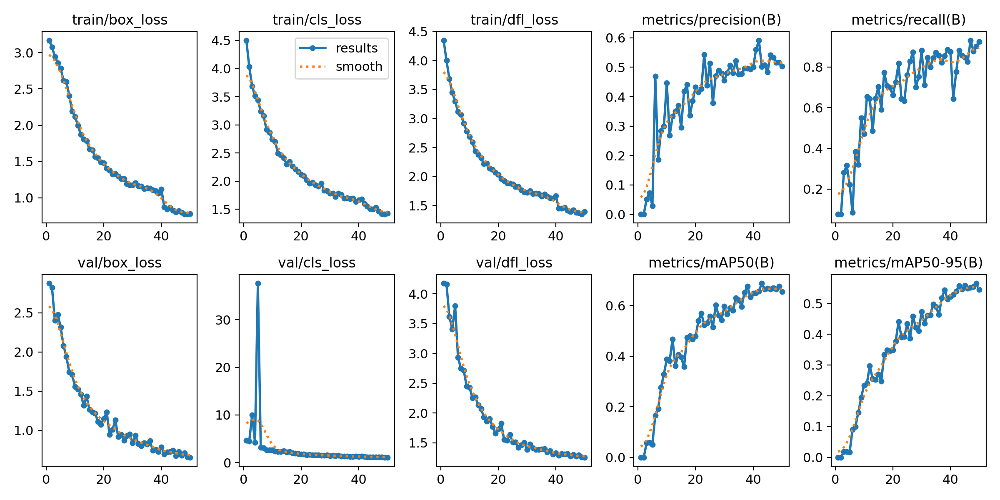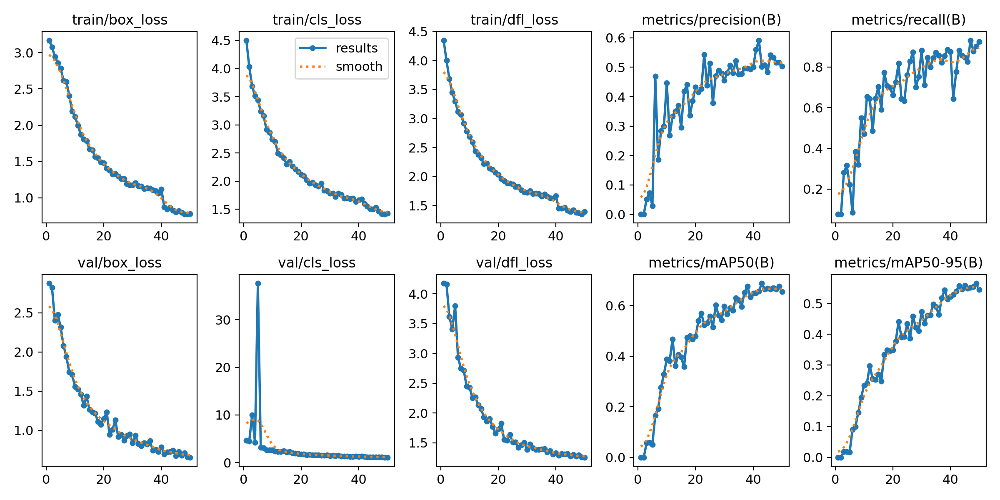